# Monthly data generation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import skill_metrics as sm
import pandas as pd
import matplotlib.lines as mlines
from matplotlib import rcParams

In [2]:
arroz_all = pd.read_parquet('data/prec_monthly_obs_sat.parquet')
arroz_all['month_year'] = arroz_all['month_year'].apply(lambda x: x.to_timestamp())
arroz_all['mes'] = pd.to_datetime(arroz_all['month_year'], format='%Y-%m').dt.month

In [3]:

# Modifing default values of matplotlib
rcParams["figure.figsize"] = [12, 12]
rcParams['lines.linewidth'] = 0.3 
rcParams.update({'font.size': 8})  


# Taylor por estacion

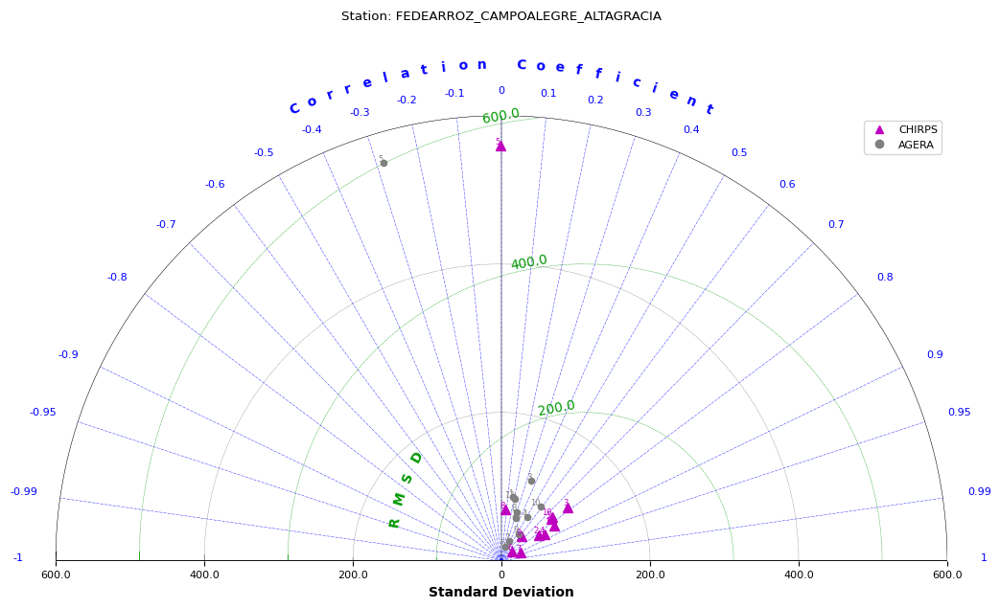

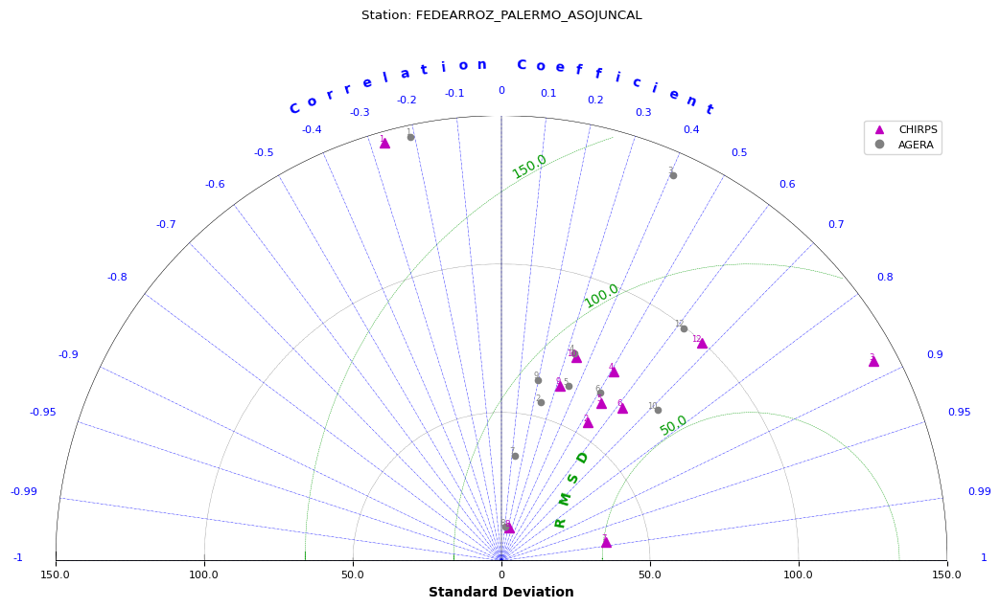

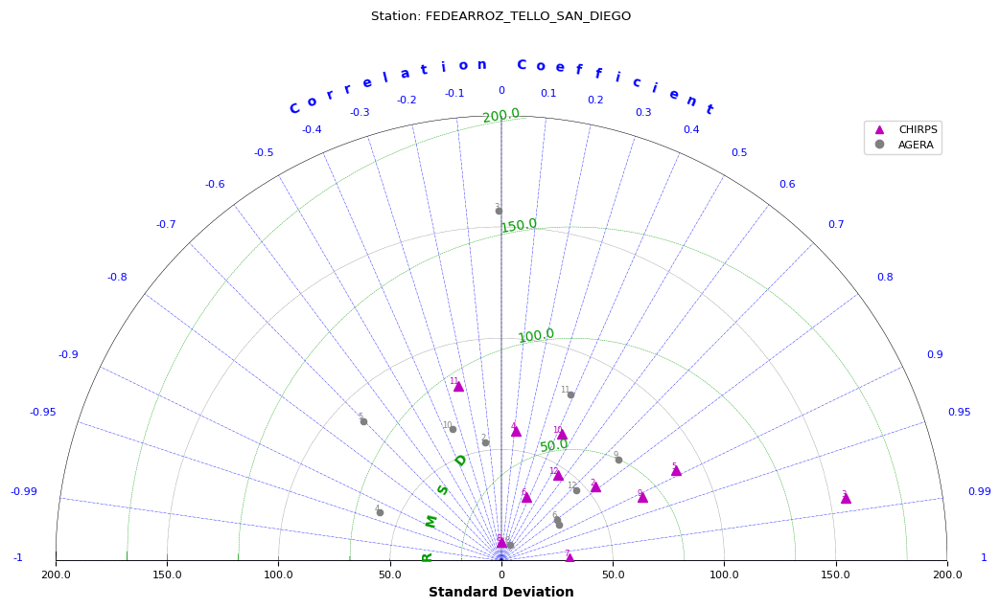

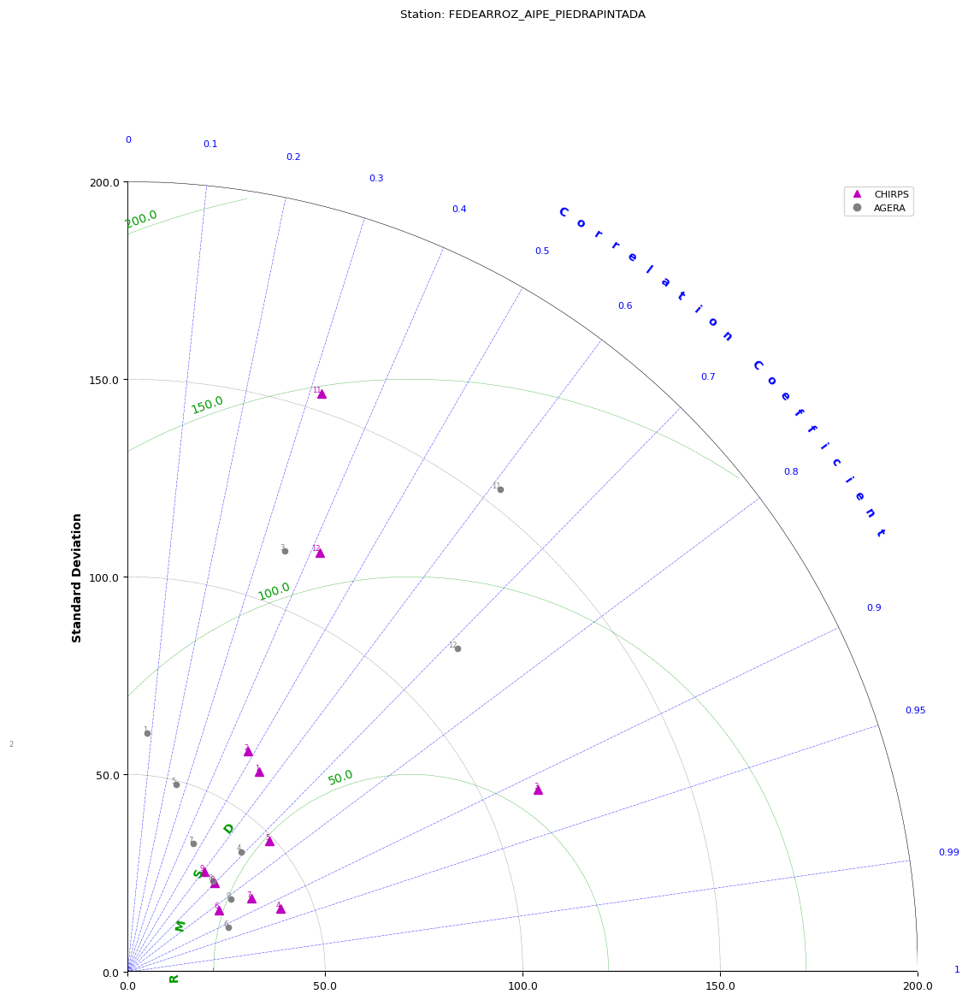

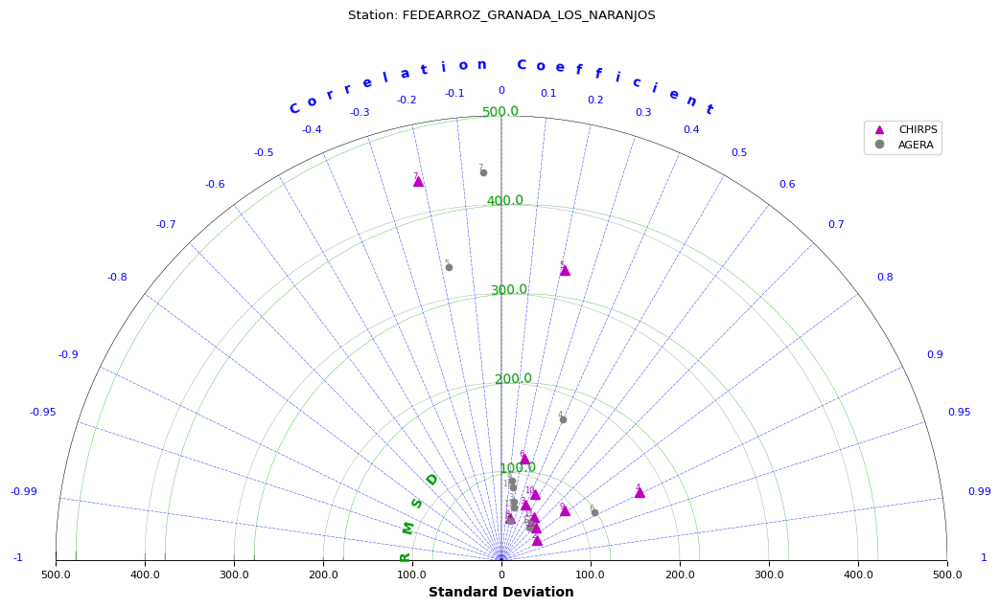

...

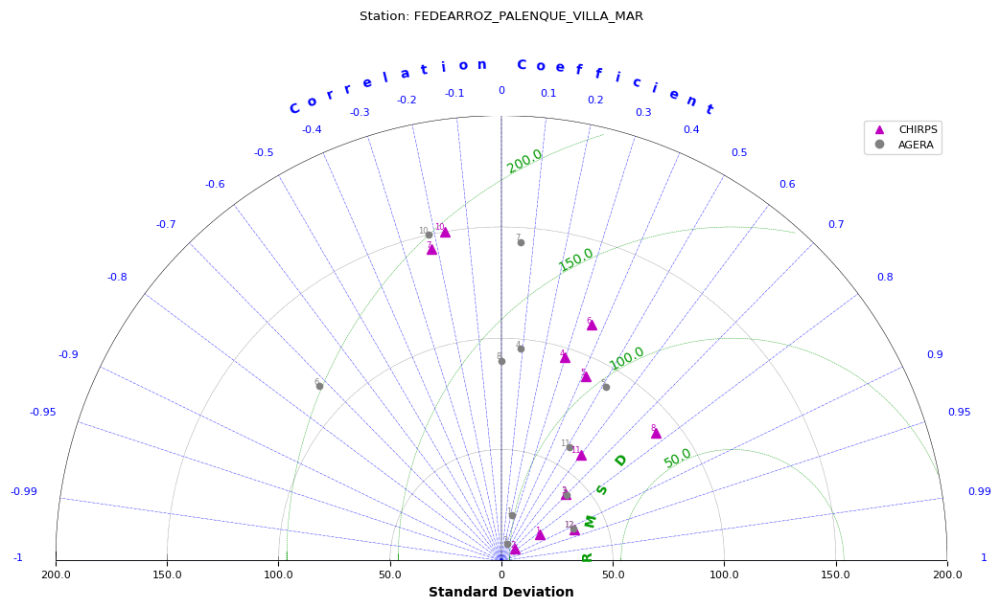

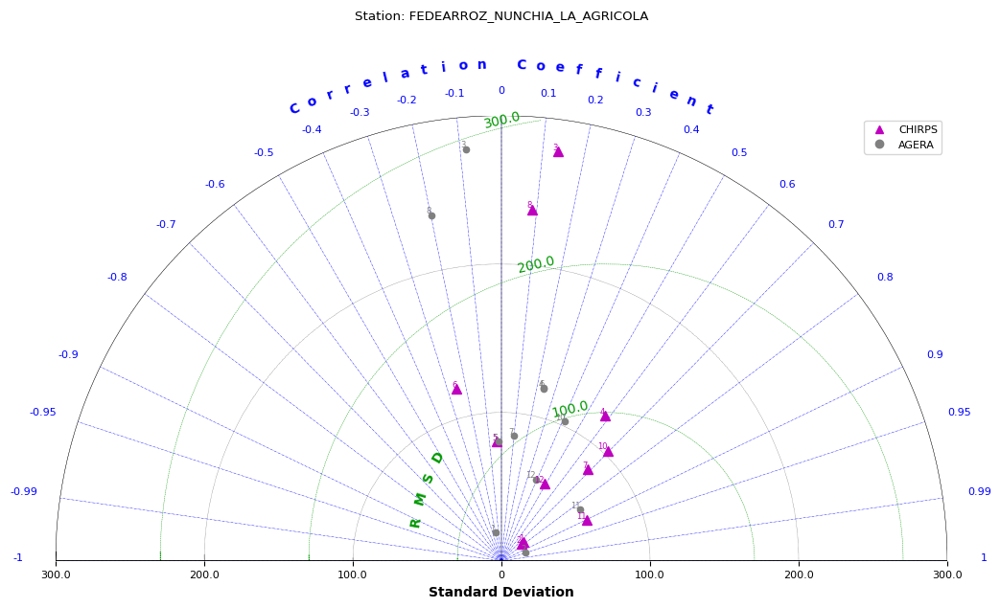

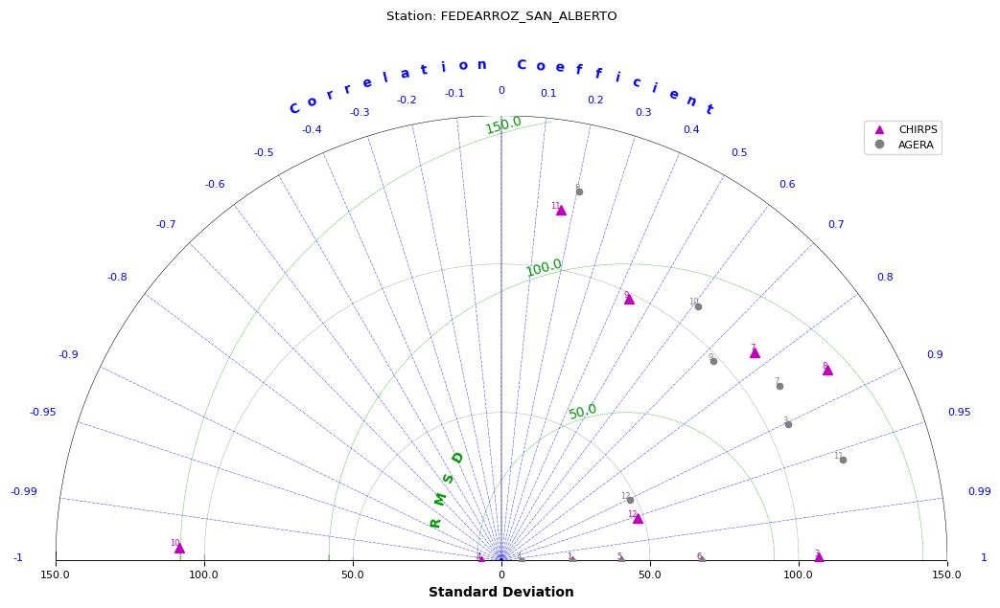

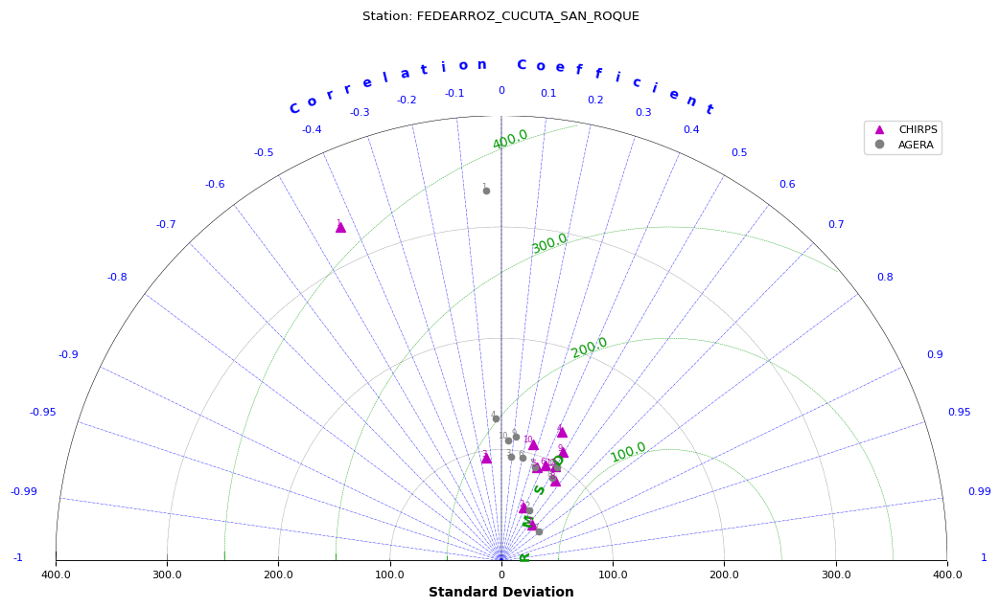

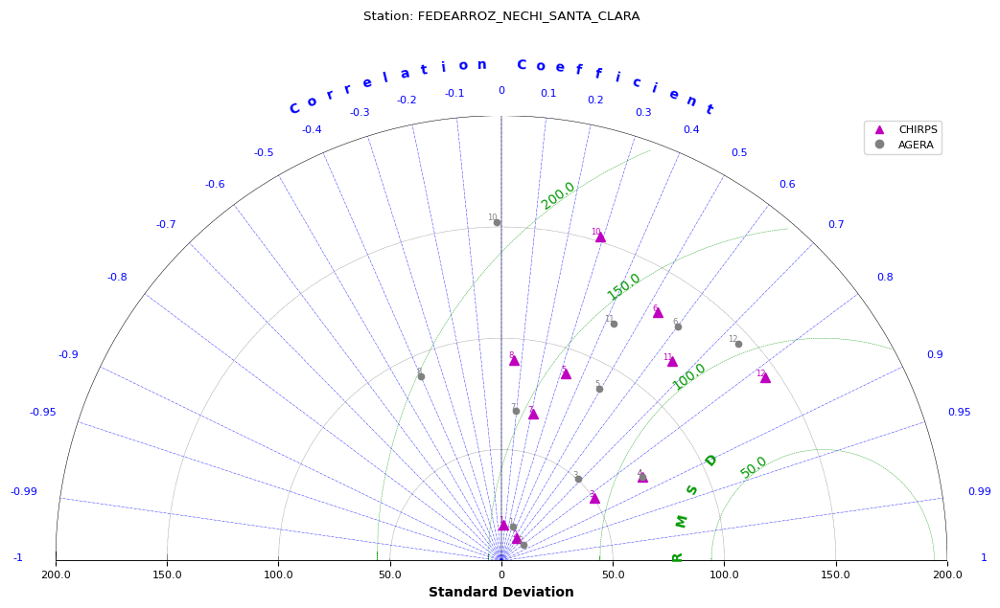

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


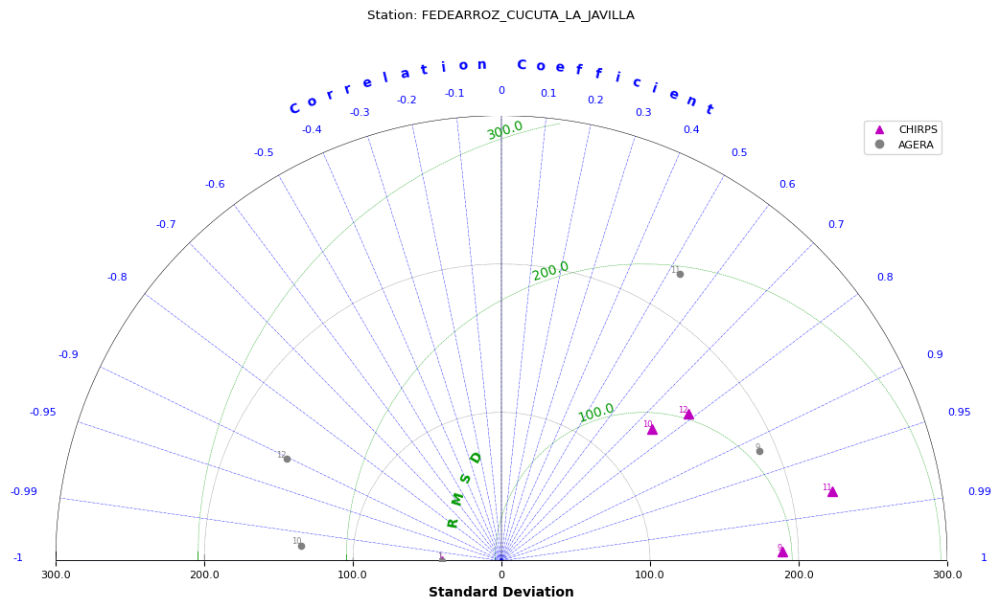

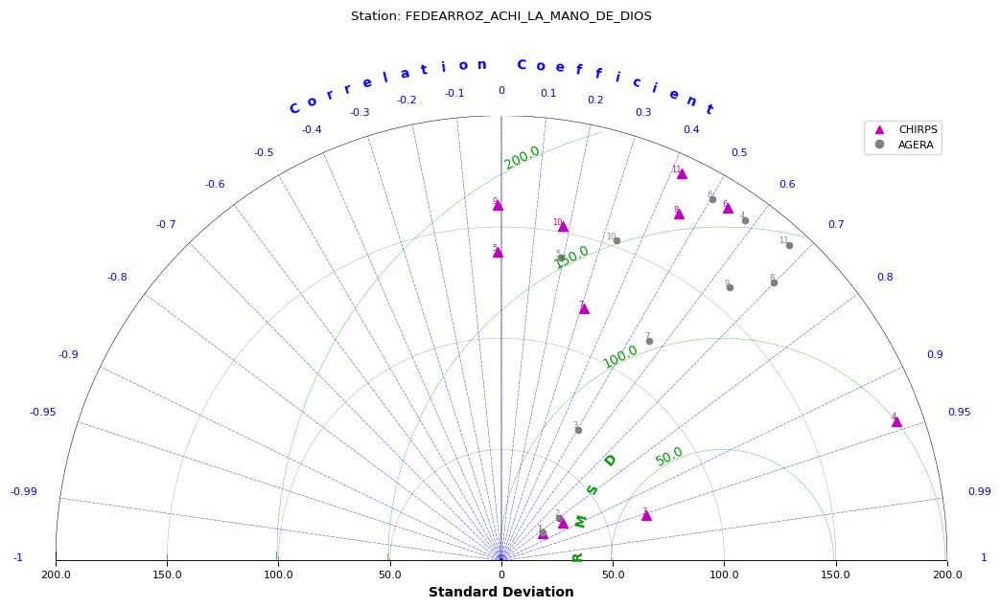

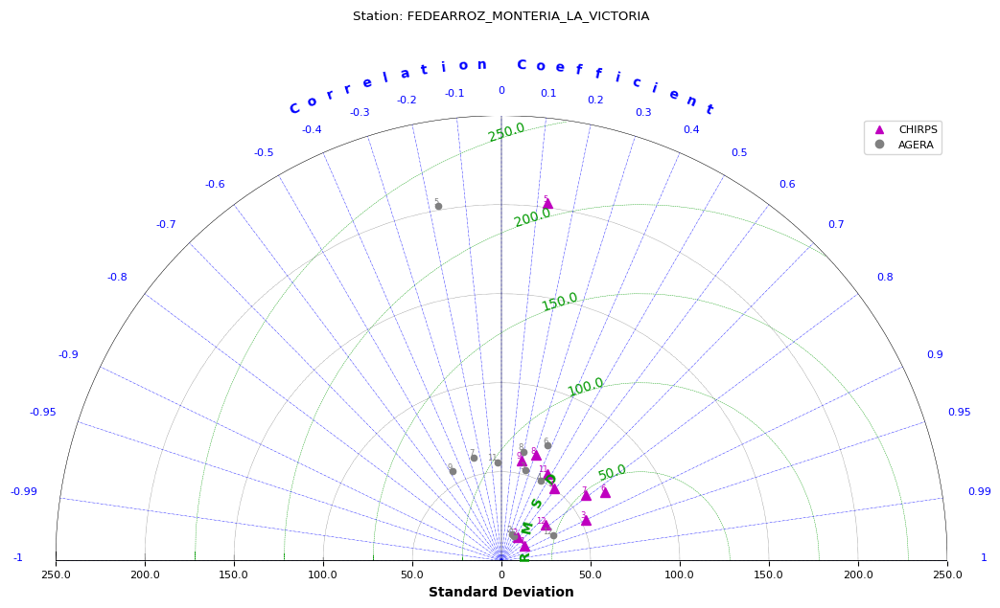

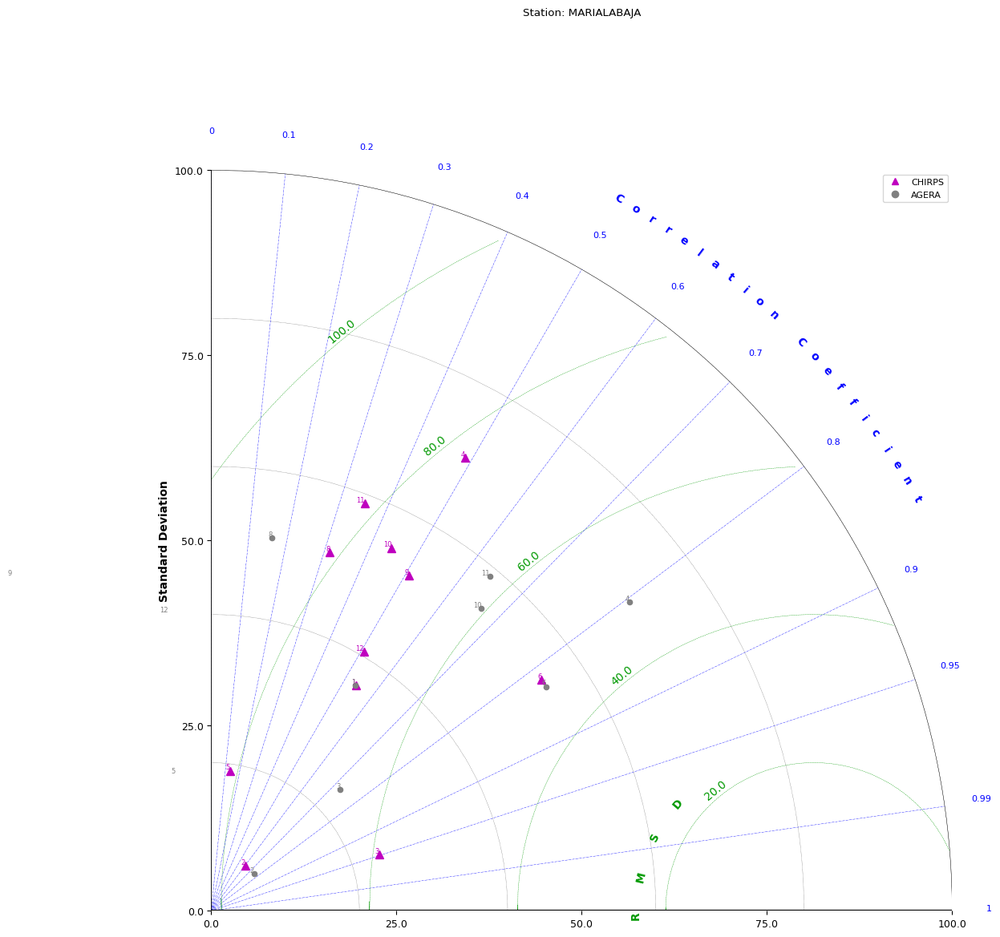

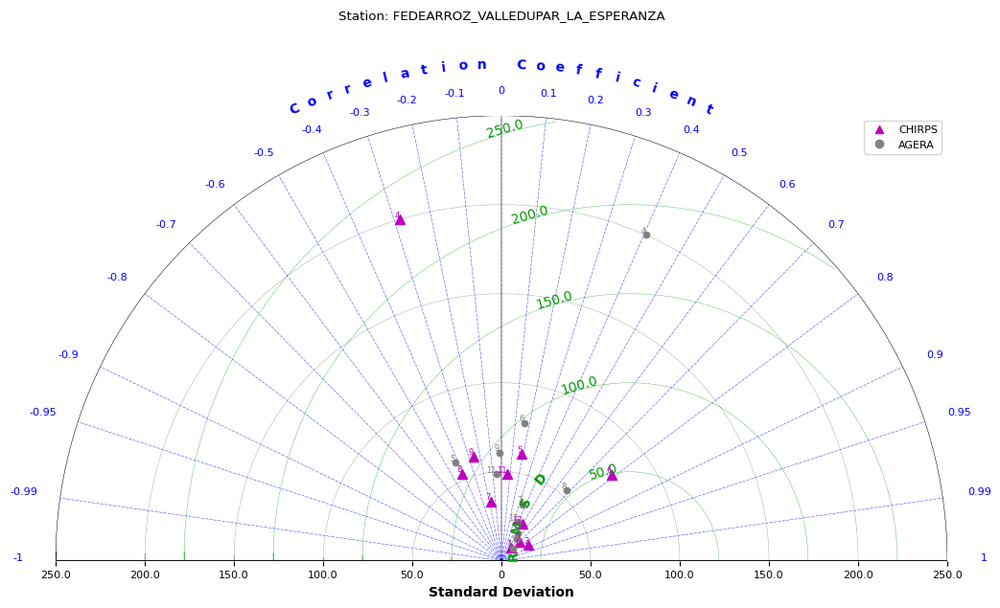

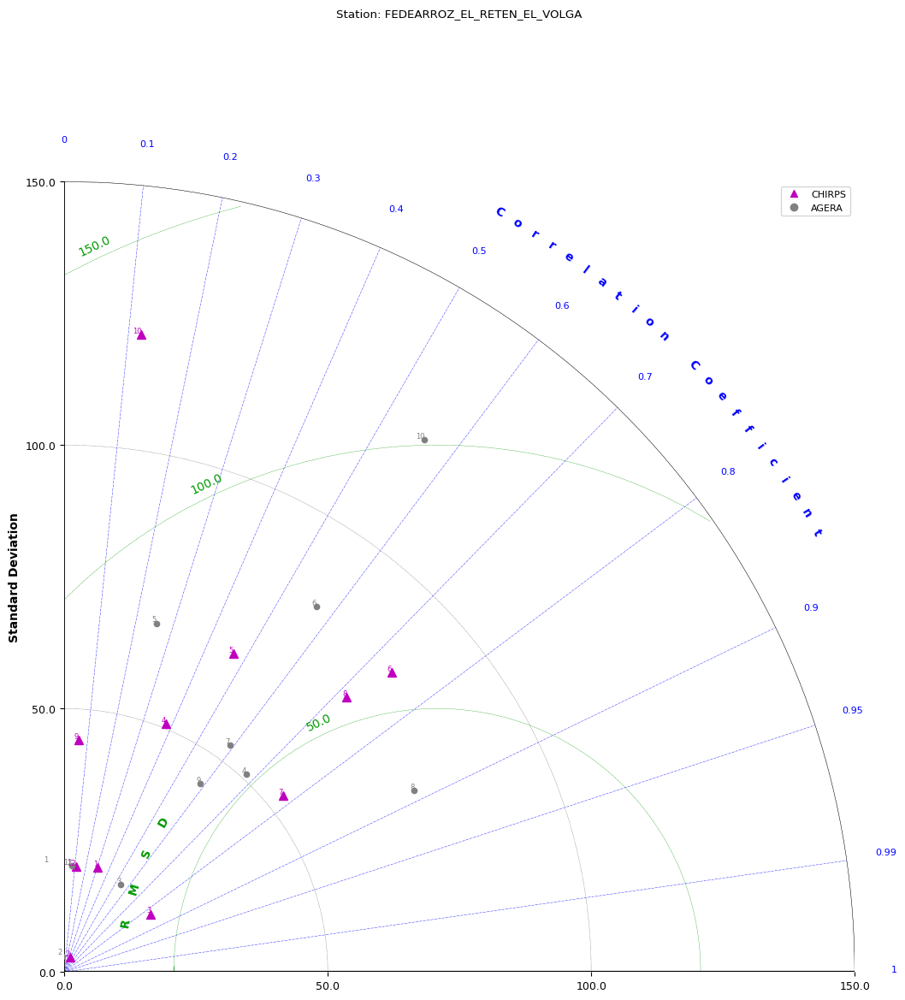

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


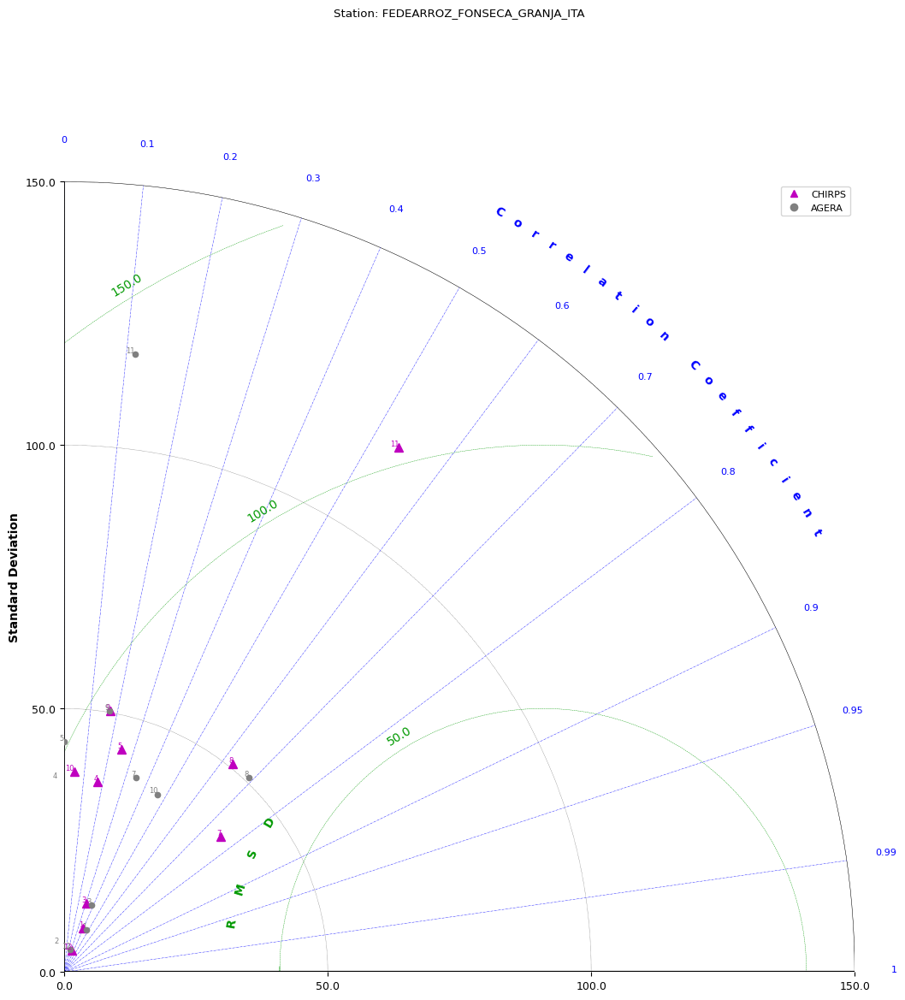

In [4]:

def taylor_diagram(df1: pd.DataFrame, df2: pd.DataFrame, original_value: str, predicted_value1: str, predicted_value2: str, month_col: str, station_name: str):
    plt.close('all')

    sdev_chirps = []
    crmsd_chirps = []
    ccoef_chirps = []
    sdev_agera = []
    crmsd_agera = []
    ccoef_agera = []
    marker_labels = []

    for mes in df1[month_col].unique():
        df_mes1 = df1[df1[month_col] == mes]
        df_mes2 = df2[df2[month_col] == mes]

        taylor_stats_chirps = sm.taylor_statistics(df_mes1[original_value], df_mes1[predicted_value1])
        sdev_chirps.append(taylor_stats_chirps['sdev'][1])
        crmsd_chirps.append(taylor_stats_chirps['crmsd'][1])
        ccoef_chirps.append(taylor_stats_chirps['ccoef'][1])

        taylor_stats_agera = sm.taylor_statistics(df_mes2[original_value], df_mes2[predicted_value2])
        sdev_agera.append(taylor_stats_agera['sdev'][1])
        crmsd_agera.append(taylor_stats_agera['crmsd'][1])
        ccoef_agera.append(taylor_stats_agera['ccoef'][1])

        marker_labels.append(str(mes))

    sdev_chirps = np.array(sdev_chirps)
    crmsd_chirps = np.array(crmsd_chirps)
    ccoef_chirps = np.array(ccoef_chirps)

    sdev_agera = np.array(sdev_agera)
    crmsd_agera = np.array(crmsd_agera)
    ccoef_agera = np.array(ccoef_agera)

    sm.taylor_diagram(sdev_chirps, crmsd_chirps, ccoef_chirps, markerLabel=marker_labels, markerColor='m', markerSize=7, markerLabelColor='m',  markerSymbol='^')#esto es triangulo
    sm.taylor_diagram(sdev_agera, crmsd_agera, ccoef_agera, markerLabel=marker_labels, markerColor='gray', markerSize=9, markerLabelColor='gray', overlay=True)

    chirps_legend = mlines.Line2D([], [], color='m', marker='^', linestyle='None', markersize=6, label='CHIRPS')
    agera_legend = mlines.Line2D([], [], color='gray', marker='o', linestyle='None', markersize=6, label='AGERA')

    plt.legend(handles=[chirps_legend, agera_legend])
    plt.title(f"Station: {station_name}", y=1.2)  # Ajuste del título con `y=1.1`
    plt.show()

# Iterar sobre cada estación única en el dataframe `arroz_all`
for station in arroz_all['station'].unique():
    test = arroz_all[arroz_all['station'] == station]
    
    testy = test[test['fuente'] == 'fedearroz'][['month_year', 'mes', 'prec_month']].merge(
        test[test['fuente'] == 'chirps-precipitation'][['month_year', 'mes', 'prec_month']], 
        how='inner', on=['month_year', 'mes']
    ).rename(columns={'prec_month_x': 'prec_month_fede', 'prec_month_y': 'prec_month_chirps'})
    
    testy2 = test[test['fuente'] == 'fedearroz'][['month_year', 'mes', 'prec_month']].merge(
        test[test['fuente'] == 'agera5-precipitation'][['month_year', 'mes', 'prec_month']], 
        how='inner', on=['month_year', 'mes']
    ).rename(columns={'prec_month_x': 'prec_month_fede', 'prec_month_y': 'prec_month_agera'})

    # Generar el diagrama de Taylor para la estación actual
    taylor_diagram(testy, testy2, 'prec_month_fede', 'prec_month_chirps', 'prec_month_agera', 'mes', station)


# Taylor por estacion para solo los meses intermedios

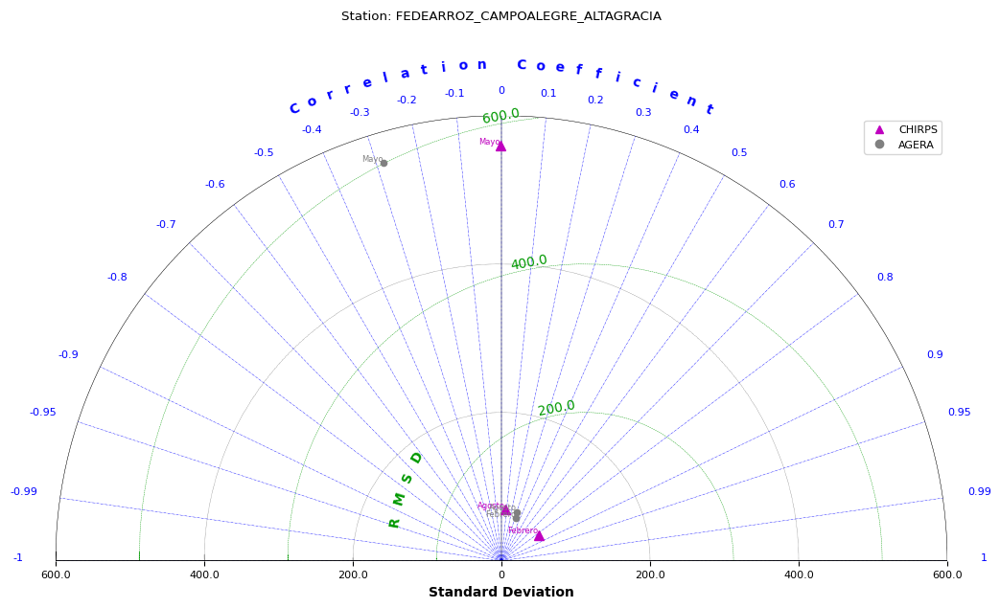

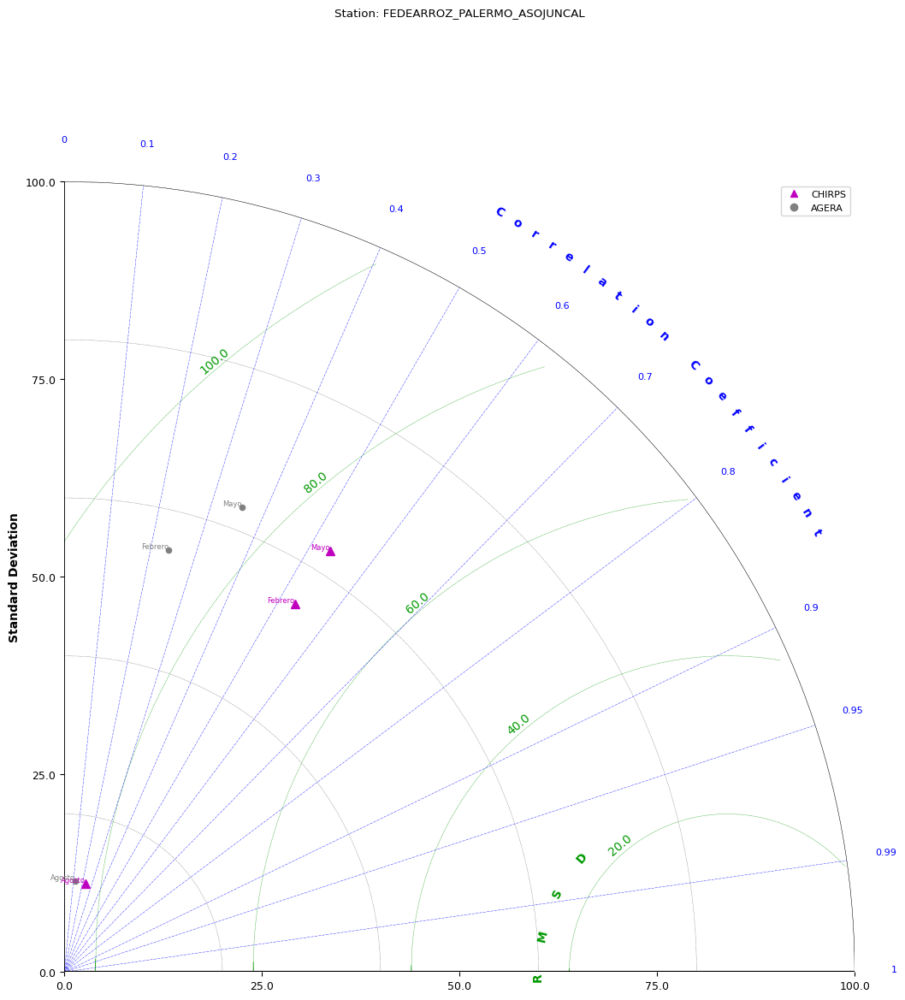

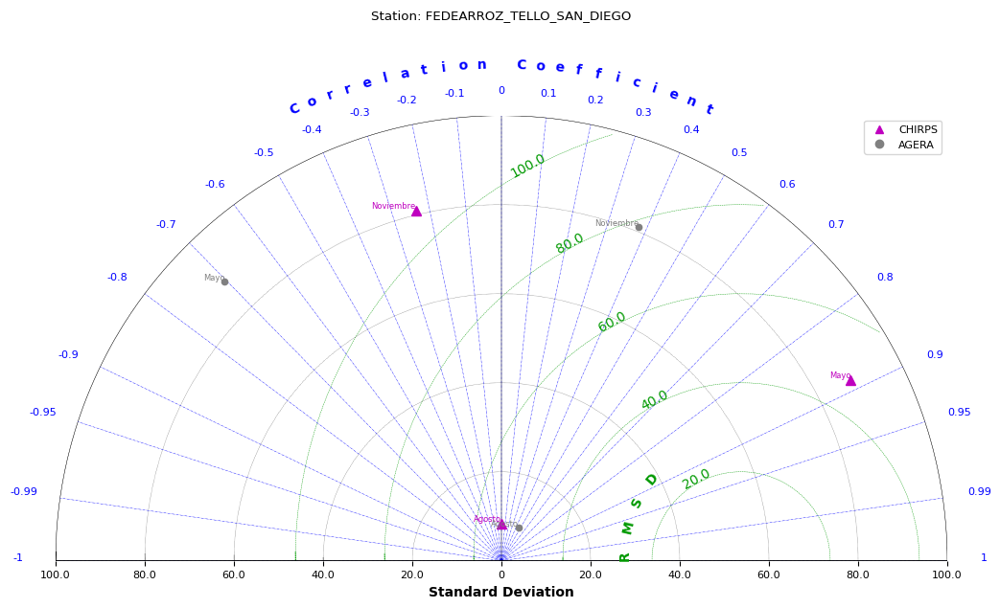

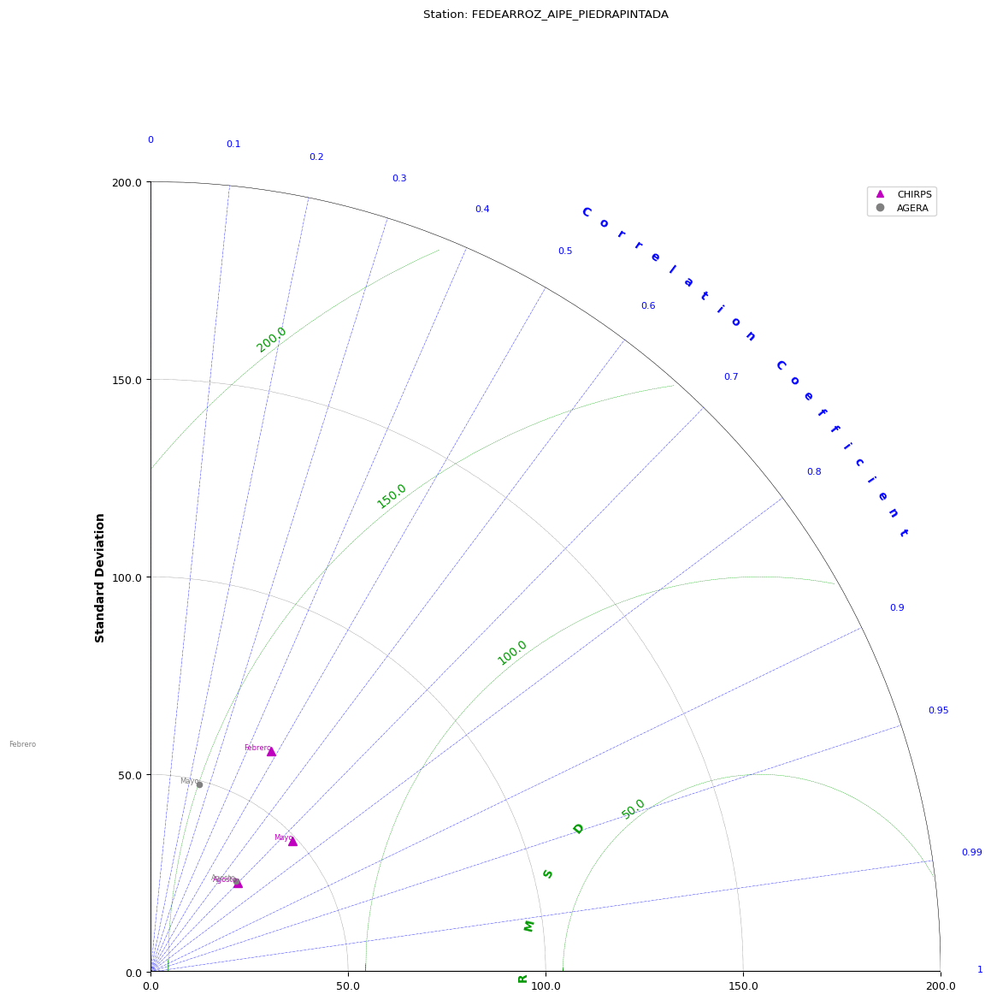

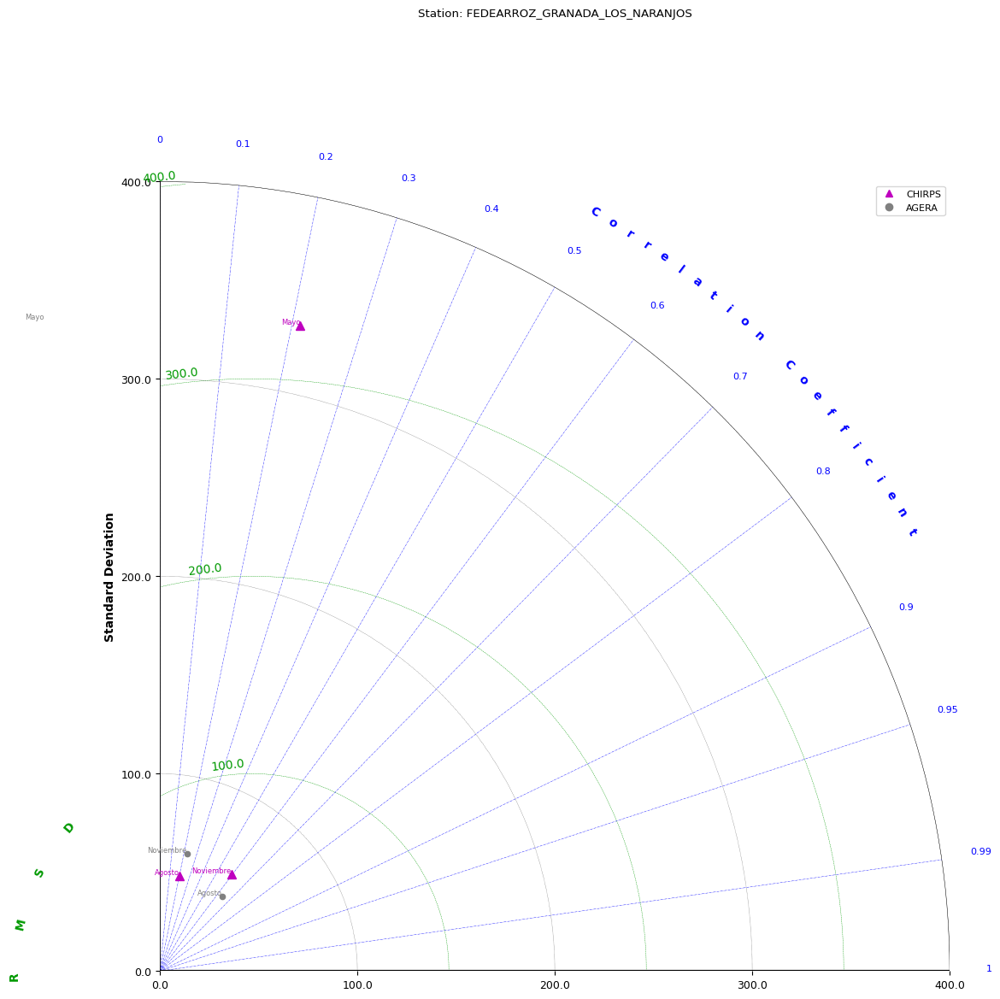

...

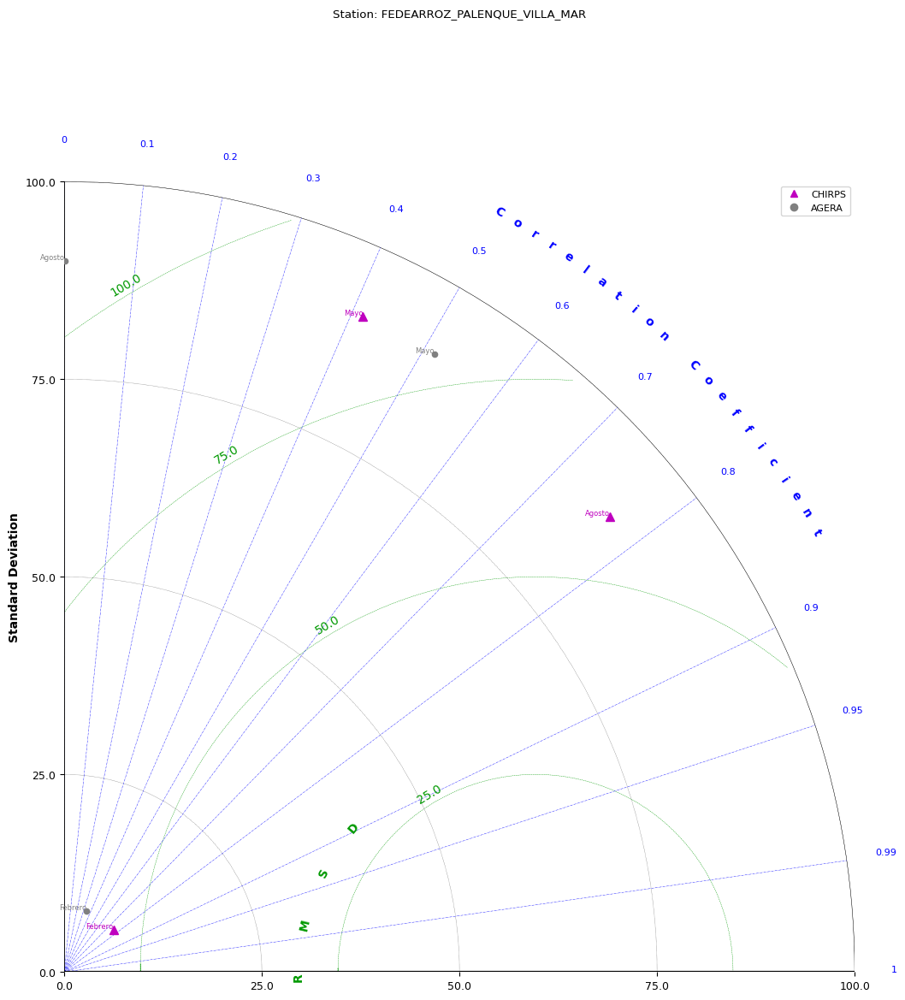

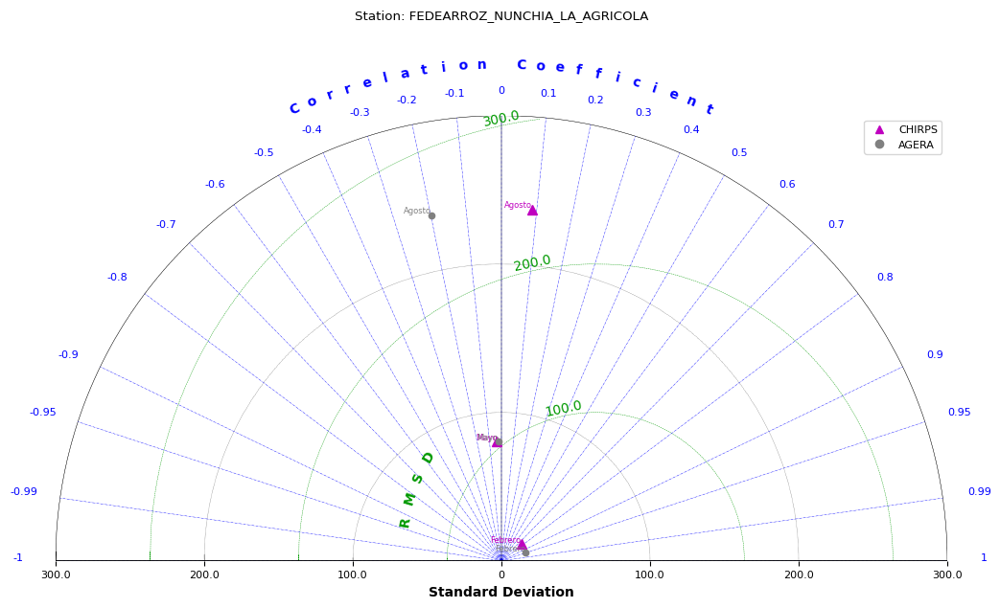

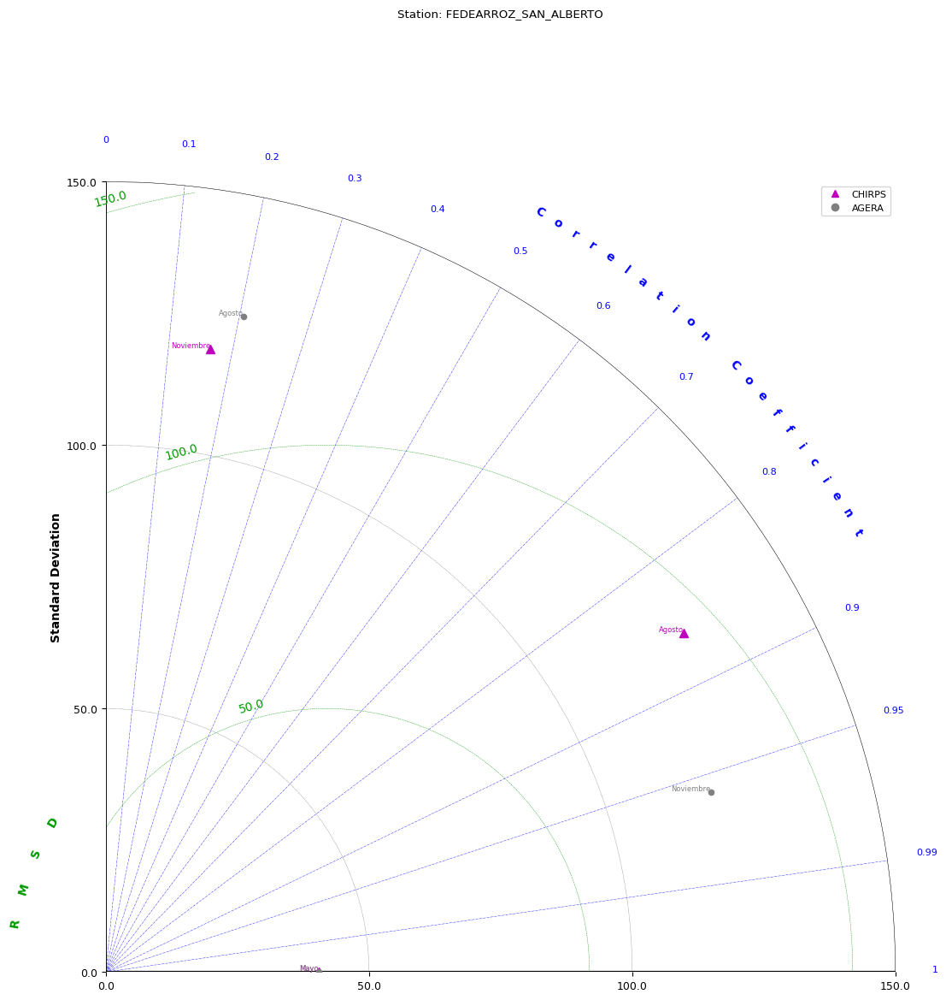

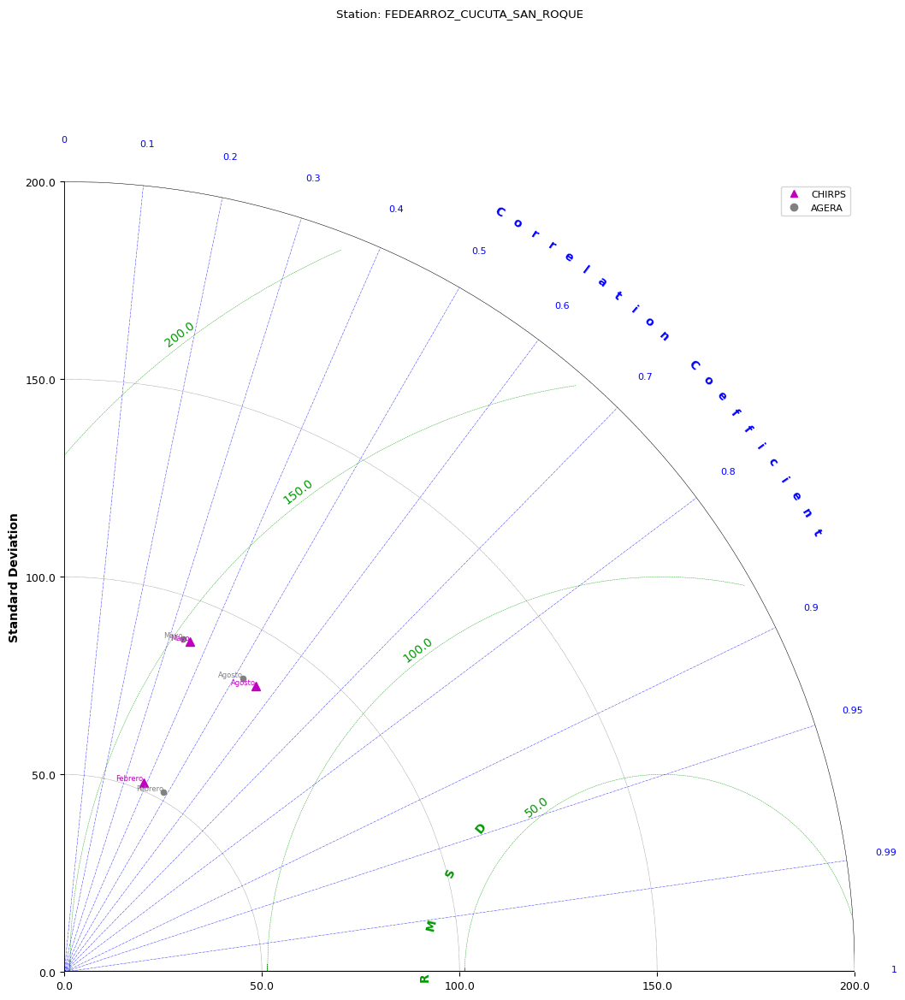

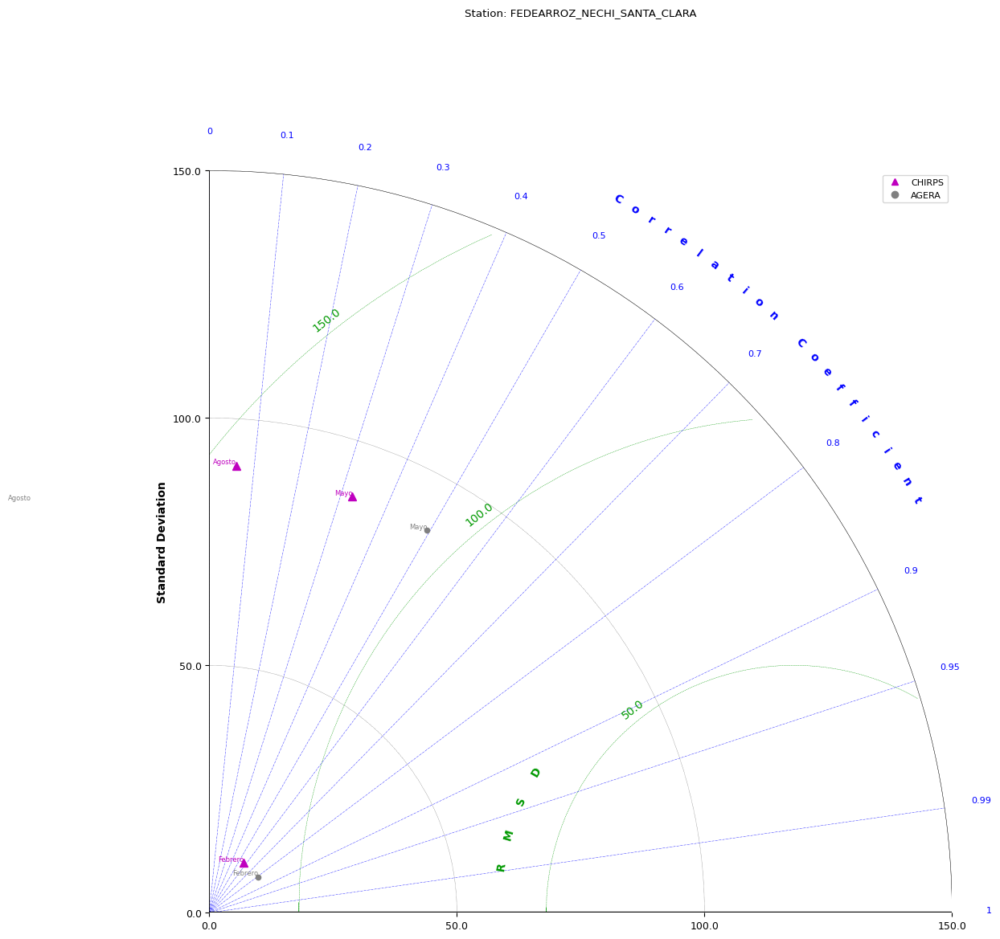

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


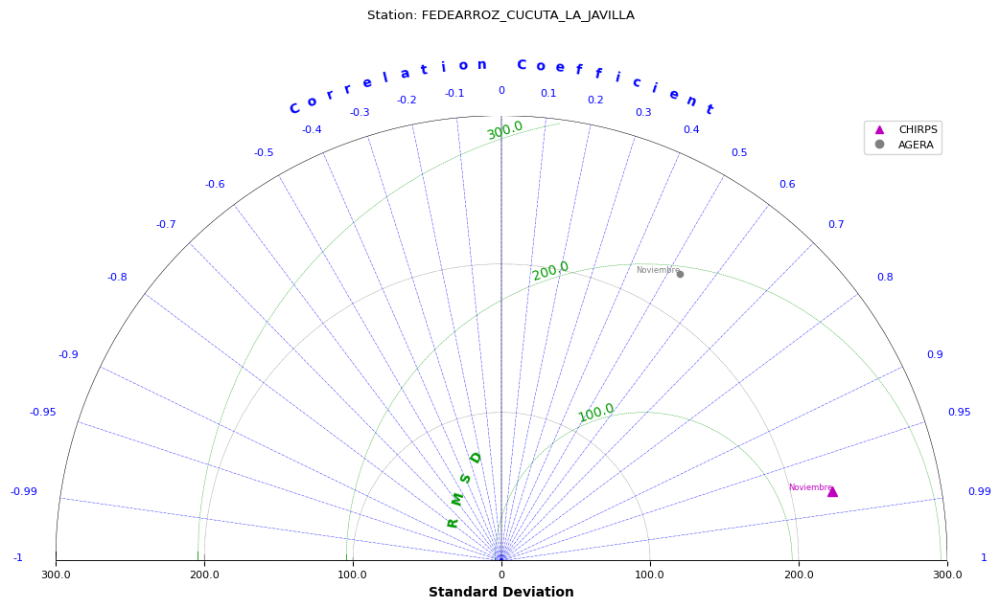

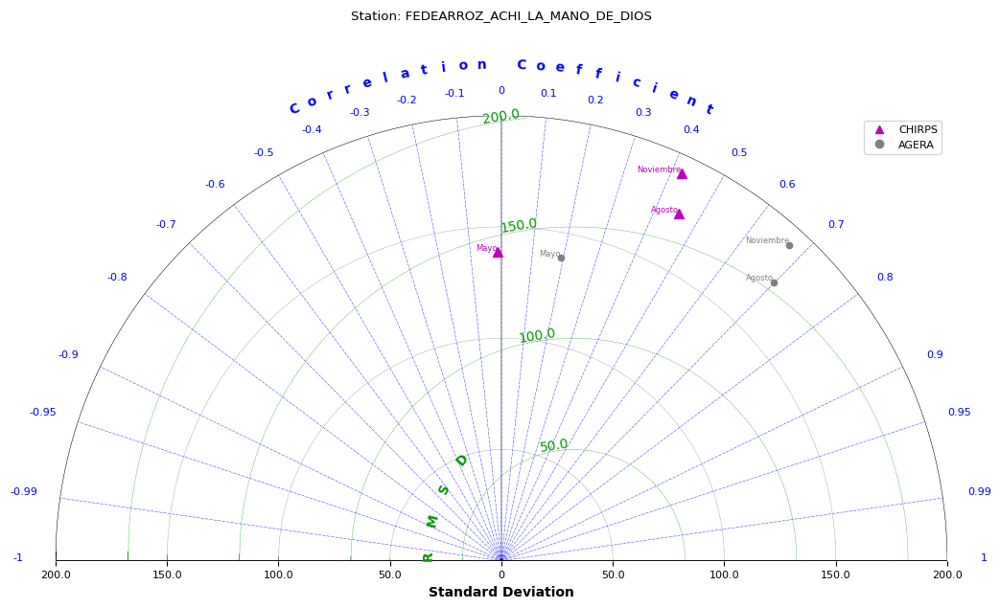

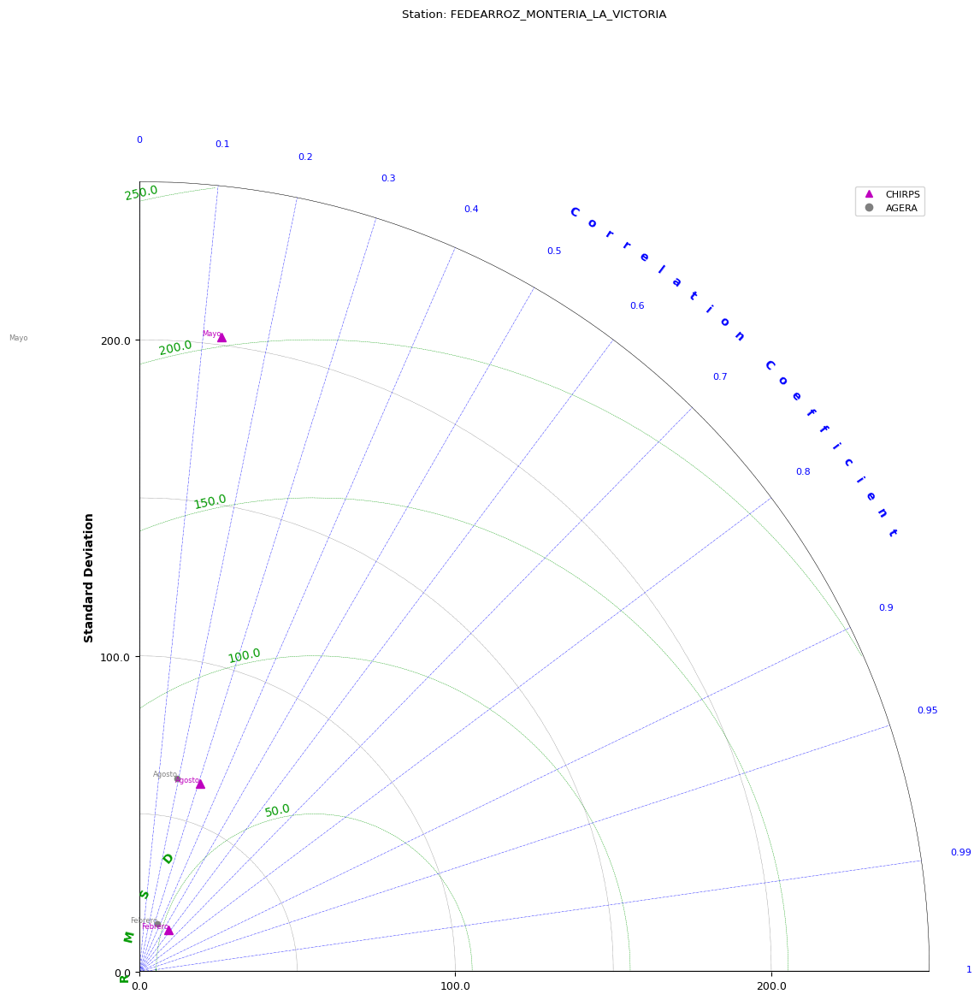

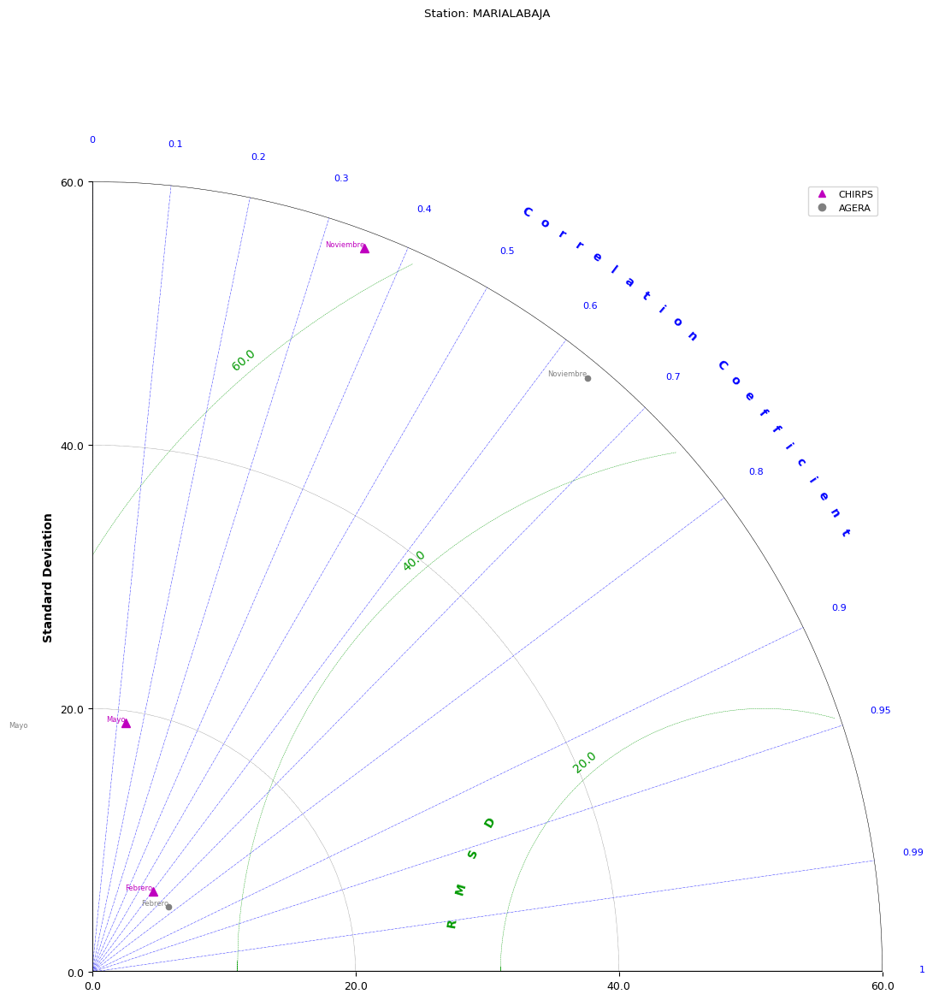

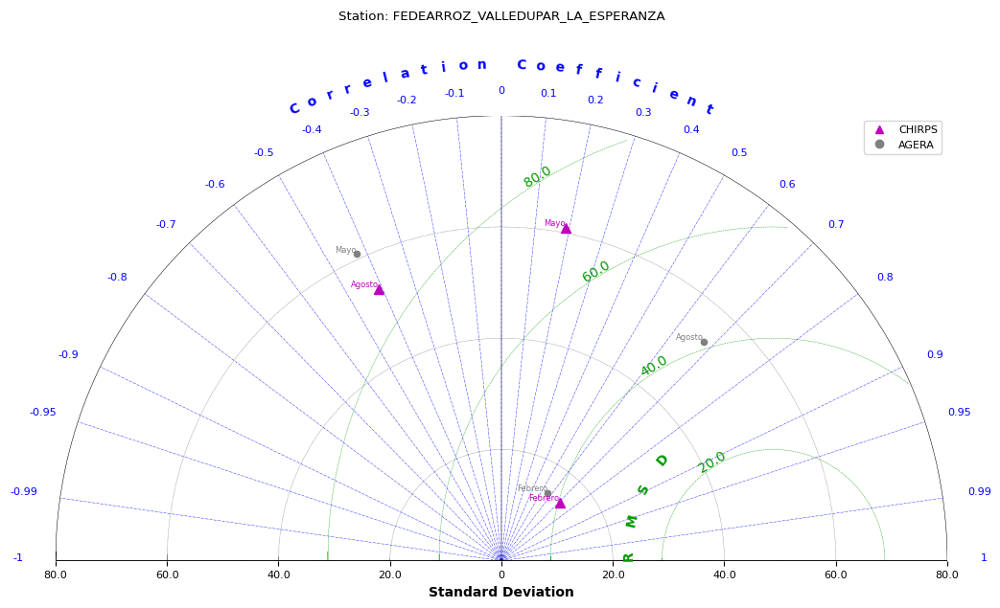

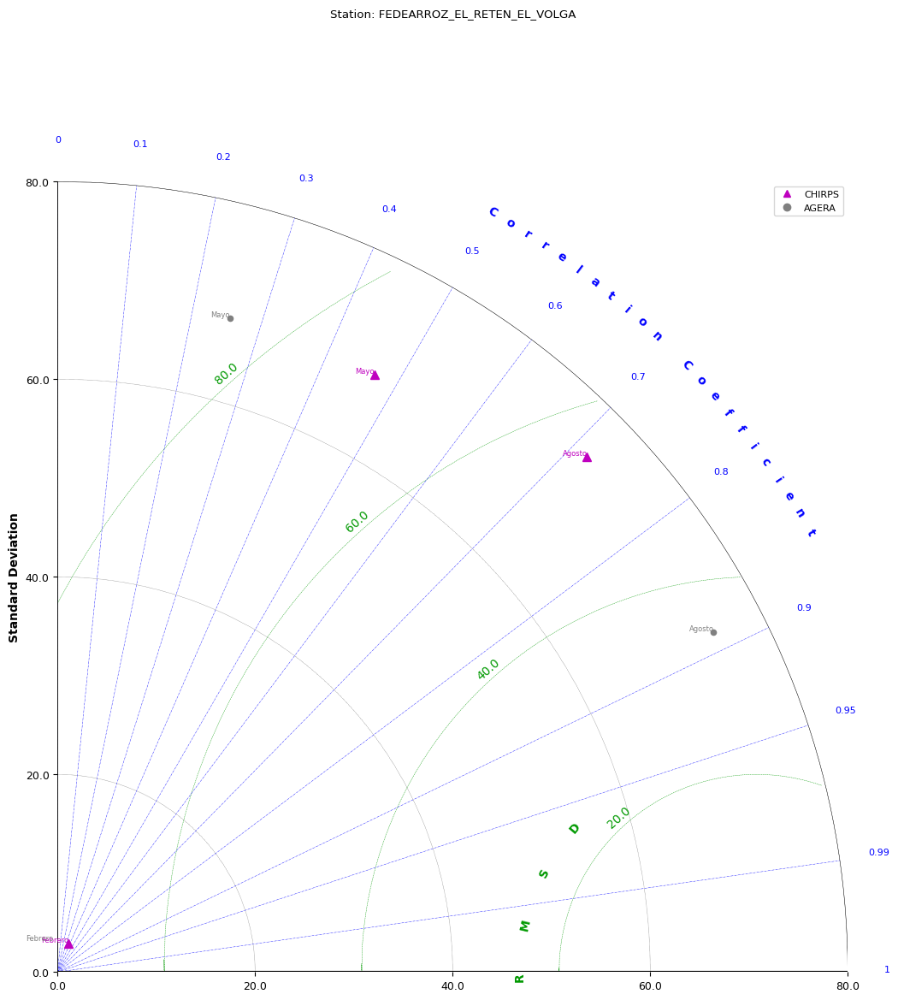

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


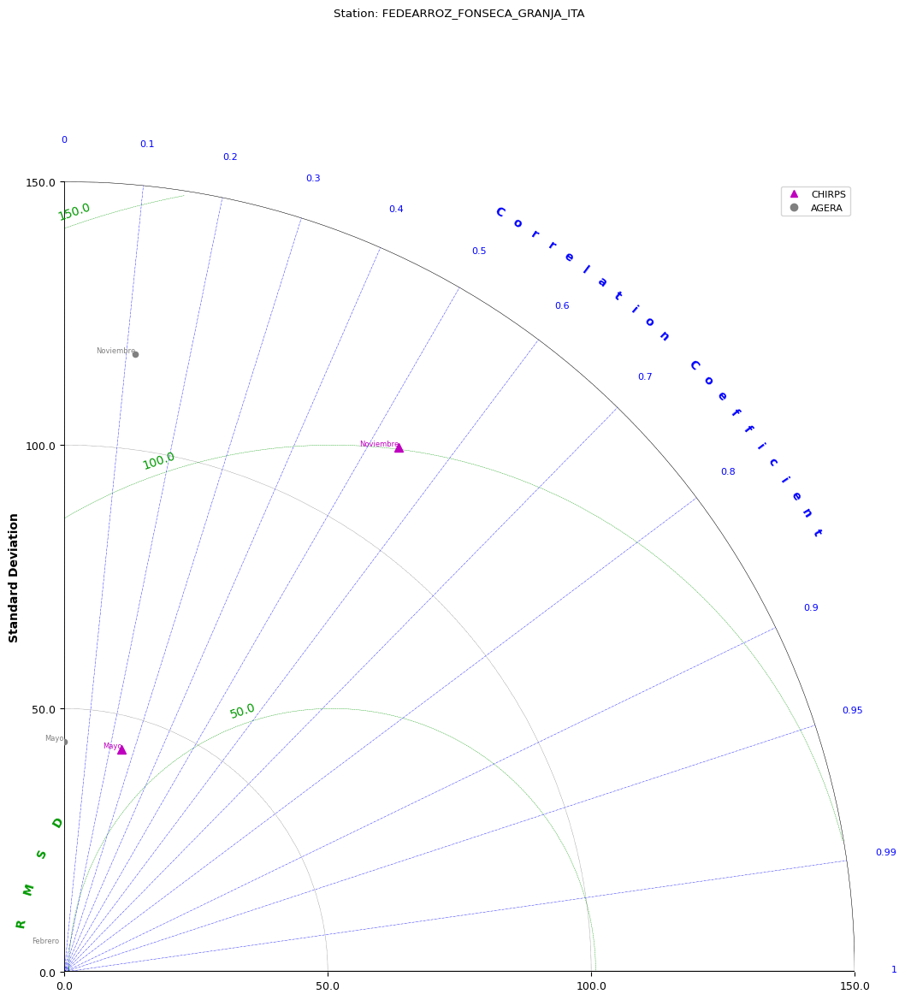

In [5]:
def taylor_diagram(df1: pd.DataFrame, df2: pd.DataFrame, original_value: str, predicted_value1: str, predicted_value2: str, month_col: str, station_name: str):
    plt.close('all')

    # Meses y sus etiquetas personalizadas
    target_months = {2: 'Febrero', 5: 'Mayo', 8: 'Agosto', 11: 'Noviembre'}
    
    sdev_chirps = []
    crmsd_chirps = []
    ccoef_chirps = []
    sdev_agera = []
    crmsd_agera = []
    ccoef_agera = []
    marker_labels = []

    # Filtrar  meses deseados
    for mes in df1[month_col].unique():
        if mes in target_months:
            df_mes1 = df1[df1[month_col] == mes]
            df_mes2 = df2[df2[month_col] == mes]

            taylor_stats_chirps = sm.taylor_statistics(df_mes1[original_value], df_mes1[predicted_value1])
            sdev_chirps.append(taylor_stats_chirps['sdev'][1])
            crmsd_chirps.append(taylor_stats_chirps['crmsd'][1])
            ccoef_chirps.append(taylor_stats_chirps['ccoef'][1])

            taylor_stats_agera = sm.taylor_statistics(df_mes2[original_value], df_mes2[predicted_value2])
            sdev_agera.append(taylor_stats_agera['sdev'][1])
            crmsd_agera.append(taylor_stats_agera['crmsd'][1])
            ccoef_agera.append(taylor_stats_agera['ccoef'][1])

            marker_labels.append(target_months[mes])

    sdev_chirps = np.array(sdev_chirps)
    crmsd_chirps = np.array(crmsd_chirps)
    ccoef_chirps = np.array(ccoef_chirps)

    sdev_agera = np.array(sdev_agera)
    crmsd_agera = np.array(crmsd_agera)
    ccoef_agera = np.array(ccoef_agera)

    # Taylor 
    sm.taylor_diagram(sdev_chirps, crmsd_chirps, ccoef_chirps, markerLabel=marker_labels, markerColor='m', markerSize=7, markerLabelColor='m',  markerSymbol='^')
    sm.taylor_diagram(sdev_agera, crmsd_agera, ccoef_agera, markerLabel=marker_labels, markerColor='gray', markerSize=9, markerLabelColor='gray', overlay=True)

    
    chirps_legend = mlines.Line2D([], [], color='m', marker='^', linestyle='None', markersize=6, label='CHIRPS')
    agera_legend = mlines.Line2D([], [], color='gray', marker='o', linestyle='None', markersize=6, label='AGERA')

    plt.legend(handles=[chirps_legend, agera_legend])
    plt.title(f"Station: {station_name}", y=1.2)
    plt.show()


for station in arroz_all['station'].unique():
    test = arroz_all[arroz_all['station'] == station]
    
    testy = test[test['fuente'] == 'fedearroz'][['month_year', 'mes', 'prec_month']].merge(
        test[test['fuente'] == 'chirps-precipitation'][['month_year', 'mes', 'prec_month']], 
        how='inner', on=['month_year', 'mes']
    ).rename(columns={'prec_month_x': 'prec_month_fede', 'prec_month_y': 'prec_month_chirps'})
    
    testy2 = test[test['fuente'] == 'fedearroz'][['month_year', 'mes', 'prec_month']].merge(
        test[test['fuente'] == 'agera5-precipitation'][['month_year', 'mes', 'prec_month']], 
        how='inner', on=['month_year', 'mes']
    ).rename(columns={'prec_month_x': 'prec_month_fede', 'prec_month_y': 'prec_month_agera'})

    
    taylor_diagram(testy, testy2, 'prec_month_fede', 'prec_month_chirps', 'prec_month_agera', 'mes', station)


# test

In [6]:
arroz_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11856 entries, 0 to 11855
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   latitud     11856 non-null  float64       
 1   longitud    11856 non-null  float64       
 2   dpto        11856 non-null  object        
 3   mun         11856 non-null  object        
 4   station     11856 non-null  object        
 5   month_year  11856 non-null  datetime64[ns]
 6   fuente      11856 non-null  object        
 7   prec_month  11856 non-null  float64       
 8   mes         11856 non-null  int32         
dtypes: datetime64[ns](1), float64(3), int32(1), object(4)
memory usage: 787.4+ KB
